# Airbnb Projects

In [1]:
import numpy as np
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.colors as colors
pio.templates.default = "plotly_white"
from scipy.stats import gaussian_kde

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('compressed_data.csv')
df.head(5)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [4]:
df.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [5]:
df.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

# Data PreProcessing

# Handling Missing Values & Convert Data and Time

In [6]:
# Convert 'last review' to datetime and handel errors
df['last review'] = pd.to_datetime(df['last review'], errors = 'coerce')

# Fill missing values
df.fillna({'reviews per month' : 0, 'last review' : df['last review'].min()}, inplace = True)

# Drop the NaN values of 'NAME' and 'host name'
df.dropna(subset = ['NAME', 'host name'], inplace = True)

# Delete columns
df = df.drop(columns = ['house_rules', 'license'])

# Removing Symboles & Replacing With Float Data Type

In [7]:
df['price'] = df['price'].replace('[\$,]', '', regex = True).astype(float)
df['service fee'] = df['service fee'].replace('[\$,]', '', regex = True).astype(float)

# Removing Duplicates

In [8]:
df.drop_duplicates(inplace = True)

# Confirm Data Cleaning

In [9]:
df.head(5)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,2020.0,966.0,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,2007.0,142.0,28.0,30.0,45.0,2022-05-21,0.38,4.0,2.0,228.0
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,2005.0,620.0,124.0,3.0,0.0,2012-07-11,0.00,5.0,1.0,352.0
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,2009.0,204.0,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.74767,-73.97500,United States,...,2013.0,577.0,115.0,3.0,74.0,2019-06-22,0.59,3.0,1.0,374.0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101410 entries, 0 to 102057
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   id                              101410 non-null  int64         
 1   NAME                            101410 non-null  object        
 2   host id                         101410 non-null  int64         
 3   host_identity_verified          101134 non-null  object        
 4   host name                       101410 non-null  object        
 5   neighbourhood group             101384 non-null  object        
 6   neighbourhood                   101394 non-null  object        
 7   lat                             101402 non-null  float64       
 8   long                            101402 non-null  float64       
 9   country                         100884 non-null  object        
 10  country code                    101288 non-null  object      

In [11]:
df.isnull().sum()

id                                  0
NAME                                0
host id                             0
host_identity_verified            276
host name                           0
neighbourhood group                26
neighbourhood                      16
lat                                 8
long                                8
country                           526
country code                      122
instant_bookable                   96
cancellation_policy                70
room type                           0
Construction year                 200
price                             239
service fee                       268
minimum nights                    394
number of reviews                 182
last review                         0
reviews per month                   0
review rate number                307
calculated host listings count    318
availability 365                  420
dtype: int64

# Descriptive Statistics

In [12]:
df.describe()

,id,host id,lat,long,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365
count,1.014100e+05,1.014100e+05,101402.000000,101402.000000,101210.000000,101171.000000,101142.000000,101016.000000,101228.000000,101410,101410.000000,101103.000000,101092.000000,100990.000000
mean,2.920959e+07,4.926155e+10,40.728082,-73.949663,2012.486908,625.381008,125.043998,8.113744,27.511854,2018-05-15 21:26:08.721033728,1.163207,3.278558,7.948463,141.164660
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,50.000000,10.000000,-1223.000000,0.000000,2012-07-11 00:00:00,0.000000,1.000000,1.000000,-10.000000
25%,1.507574e+07,2.459183e+10,40.688730,-73.982570,2007.000000,340.000000,68.000000,2.000000,1.000000,2017-07-30 00:00:00,0.090000,2.000000,1.000000,3.000000
50%,2.922911e+07,4.912069e+10,40.722300,-73.954440,2012.000000,625.000000,125.000000,3.000000,7.000000,2019-05-23 00:00:00,0.480000,3.000000,1.000000,96.000000
75%,4.328308e+07,7.399747e+10,40.762750,-73.932340,2017.000000,913.000000,183.000000,5.000000,31.000000,2019-07-01 00:00:00,1.710000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,1200.000000,240.000000,5645.000000,1024.000000,2058-06-16 00:00:00,90.000000,5.000000,332.000000,3677.000000
std,1.626820e+07,2.853703e+10,0.055850,0.049474,5.765130,331.609111,66.313374,30.378014,49.549258,NaN,1.683708,1.285369,32.328974,135.419199


# Data Visualization
# Q1. What is the distribution of listing prices?

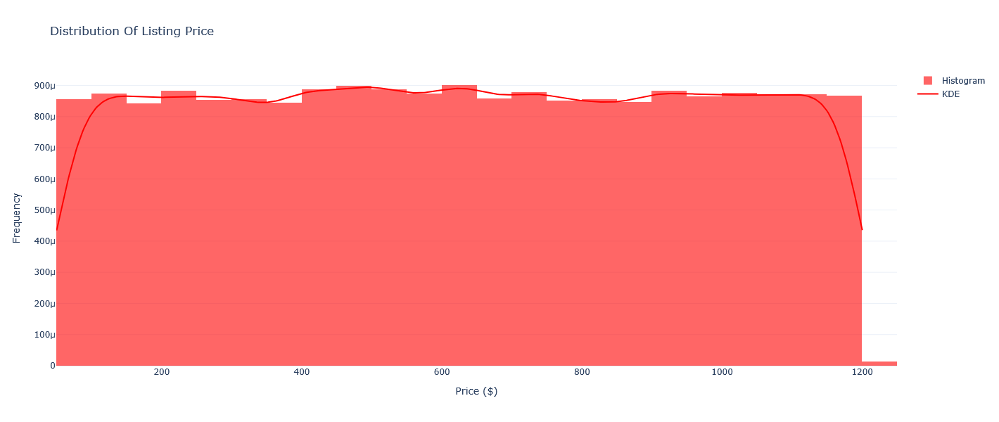

In [13]:
# Drop NaN values in 'price' column
price_data = df['price'].dropna()

# Calculate KDE using scipy
kde = gaussian_kde(price_data)
x_vals = np.linspace(price_data.min(), price_data.max(), 500)
kde_vals = kde(x_vals)

# Create histogram (normalized to probability density like sns)
hist = go.Histogram(
    x = price_data,
    nbinsx = 50,
    histnorm = 'probability density',
    name = 'Histogram',
    marker_color = 'red',
    opacity = 0.6
)

# KDE line
kde_line = go.Scatter(
    x = x_vals,
    y = kde_vals,
    mode = 'lines',
    name = 'KDE',
    line = dict(color = 'red', width = 2)
)

# Combine both in one figure
fig = go.Figure(data=[hist, kde_line])

# Layout
fig.update_layout(
    title = 'Distribution Of Listing Price',
    xaxis_title = 'Price ($)',
    yaxis_title = 'Frequency',
    width = 1000,
    height = 600
)

fig.show()

# Q2. How are different room types distribution?

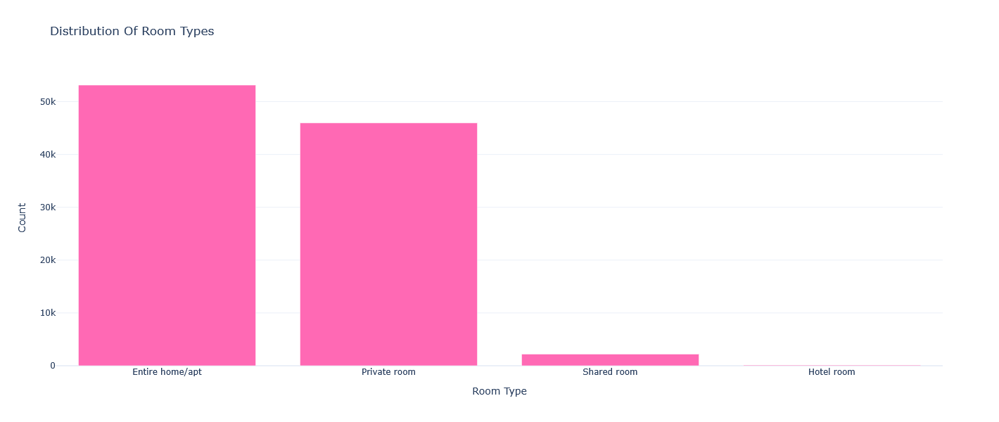

In [14]:
# Create a count plot using Plotly
fig = px.bar(
    df['room type'].value_counts().reset_index(),
    x = 'room type',
    y = 'count',
    color_discrete_sequence = ['hotpink'],
    title = 'Distribution Of Room Types'
)

# Update layout for size and axis labels
fig.update_layout(
    xaxis_title = 'Room Type',
    yaxis_title = 'Count',
    width = 1000,
    height = 600
)

fig.show()

# Q3. How are listings distribution across different neighbourhoods?

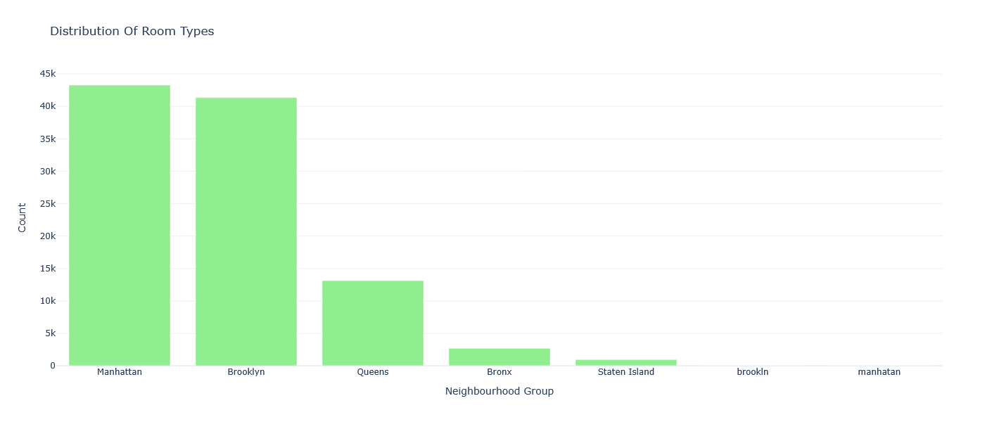

In [15]:
fig = px.bar(
    df['neighbourhood group'].value_counts().reset_index(),
    x = 'neighbourhood group',
    y = 'count',
    color_discrete_sequence = ['lightgreen'],
    title = 'Distribution Of Room Types'
)

# Update layout for size and axis labels
fig.update_layout(
    xaxis_title = 'Neighbourhood Group',
    yaxis_title = 'Count',
    width = 1000,
    height = 600
)

fig.show()

# Q4. What is the relationship between price and room type?

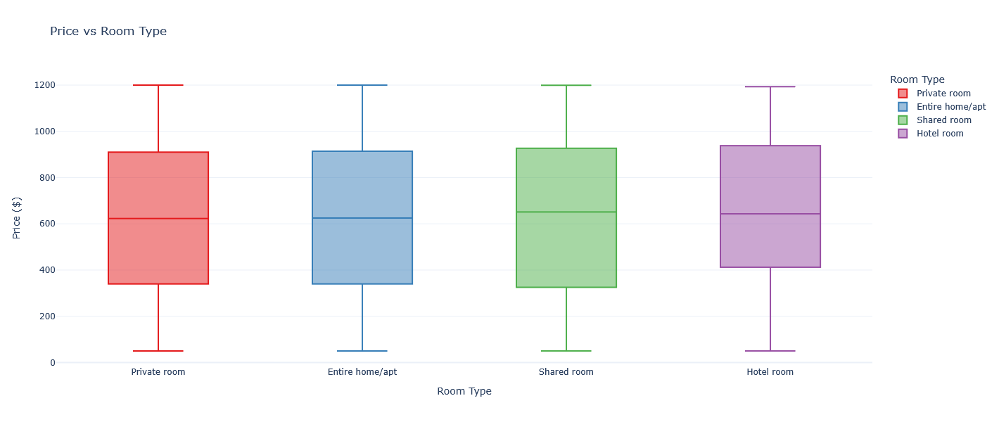

In [16]:
# Create the boxplot
fig = px.box(
    df,
    x = 'room type',
    y = 'price',
    color = 'room type',  # This acts like 'hue' in seaborn
    title = 'Price vs Room Type',
    color_discrete_sequence = px.colors.qualitative.Set1
)

# Update layout for labels and size
fig.update_layout(
    xaxis_title = 'Room Type',
    yaxis_title = 'Price ($)',
    legend_title = 'Room Type',
    width = 1000,
    height = 600
)

fig.show()

# Q5. How has the number of reviews change over time?

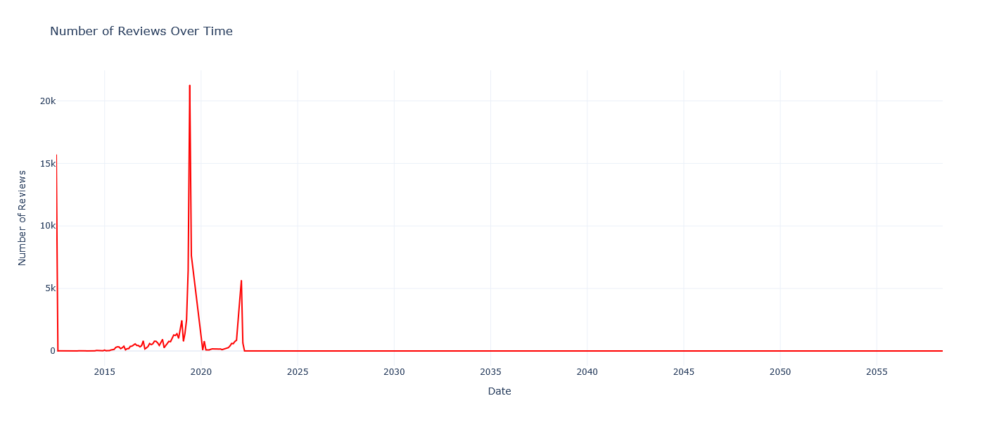

In [17]:
# Group by month and count reviews
reviews_over_time = df.groupby(df['last review'].dt.to_period('M')).size()
reviews_over_time.index = reviews_over_time.index.to_timestamp()  # Convert PeriodIndex to Timestamp for Plotly

# Create line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = reviews_over_time.index,
    y = reviews_over_time.values,
    mode = 'lines',
    name = 'Reviews',
    line = dict(color = 'red')
))

# Customize layout
fig.update_layout(
    title = 'Number of Reviews Over Time',
    xaxis_title = 'Date',
    yaxis_title = 'Number of Reviews',
    width = 1100,
    height = 600
)

fig.show()